In [89]:
from typing import List

import numpy as np
from os import getcwd, listdir
from PIL import Image

from indoorca.simulator.core import MultiAgentSim
from indoorca.simulator.core import Agent
from indoorca.visualization.core import Visualizer
from indoorca.visualization.core import VisualizerConfig


In [90]:
#Refresh the libraries before running the code
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [91]:
#Get maps from data/maps
maps = []
map_path = getcwd() + '/../data/maps/'
for map_name in listdir(map_path):
    print(map_name)
    im = Image.open(map_path + map_name)
    print(np.asarray(im).shape)
    maps.append(np.asarray(im))

test = maps[0]

Merom_1.png
(2200, 2200)


In [92]:
#TODO: Add a limit to the number of steps
#TODO: Add obstacles for outer walls
#TODO: Add white pixels in the map for better obstacle detection
num_agents = 8
self = MultiAgentSim('test', test, num_agents=num_agents)

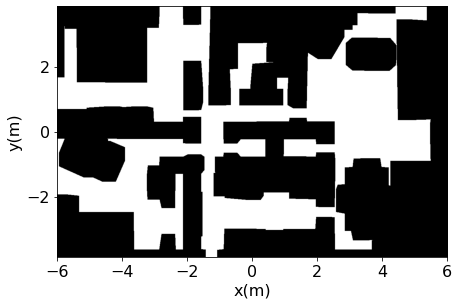

In [93]:
#We visualize the traversbility map before running the simulation

vis = Visualizer(VisualizerConfig())
background = self.env.trav_map.T
vis.add_map_background(background)
vis.render('traj', 'indoorca.gif')

In [97]:

num_agents = 8
self.reset_sim(num_agents)
starts, goals = self.get_rand_starts_and_goals()
print('Agent starts: {}'.format(starts))
print('Agent goals: {}'.format(goals))

# Note that you don't need to set the starts and goals if you use get_rand_starts_and_goals
# set_starts_and_goals allows the user to set the starts and goals manually
self.set_starts_and_goals(starts, goals)


Agent starts: {0: [-3.295, -3.16], 1: [3.425, 0.18], 2: [-2.495, 2.17], 3: [-0.915, -0.25], 4: [0.145, -0.46], 5: [1.755, 1.45], 6: [-2.535, 2.6], 7: [-1.975, -0.66]}
Agent goals: {0: [-1.165, 0.44], 1: [-2.515, 3.37], 2: [-3.215, -3.48], 3: [-3.825, -2.21], 4: [1.835, 1.24], 5: [-2.705, 1.4], 6: [-0.095, -0.34], 7: [3.565, -3.42]}


In [98]:
#TODO: In step, don't recompute the shortest path to goal each time step
#      Instead, compute it once and then get the waypoints at a random resolution
#      This will be more efficient

num_rounds = 2
max_steps = 1000
self.run(num_rounds, max_steps)

Step 0
Step 100
Step 200
Agent 3 reached goal
Agent 6 reached goal
Step 300
Agent 0 reached goal
Agent 4 reached goal
Agent 5 reached goal
Step 400
Agent 7 reached goal
Agent 1 reached goal
Step 500


/home/felipefelixarias/Research/INDOORCA/indoorca/environment/core.py:93: RuntimeWarning: invalid value encountered in double_scalars
  (np.linalg.norm(cached_slope) * np.linalg.norm(cur_slope))


Agent 2 reached goal
All agents have reached their goals
Done at step 554
Agent 6 reached goal
Agent 3 reached goal
Step 600
Agent 4 reached goal
Agent 0 reached goal
Agent 5 reached goal
Step 700
Step 800
Agent 6 reached goal
Agent 4 reached goal
Agent 3 reached goal
Step 900
Agent 7 reached goal
Agent 0 reached goal
Agent 5 reached goal
Max steps reached


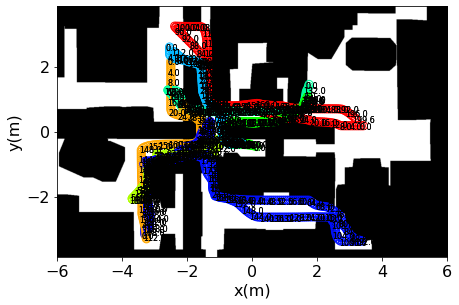

In [99]:
vis_config = VisualizerConfig()
vis = Visualizer(vis_config) 
background = self.env.trav_map.T
vis.add_map_background(background)
trajectories = self.get_trajectories()
vis.set_trajectories(trajectories[0], trajectories[1:])
vis.render('traj', 'indoorca.gif')

770


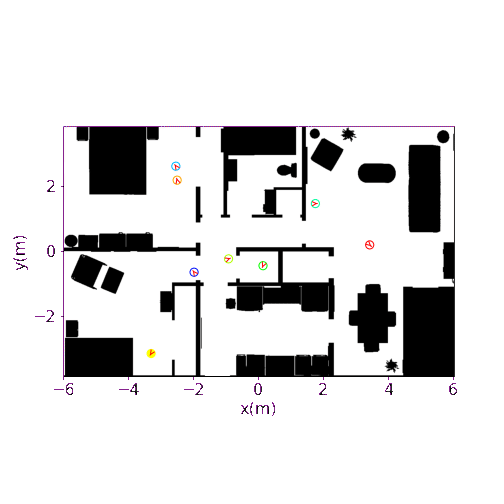

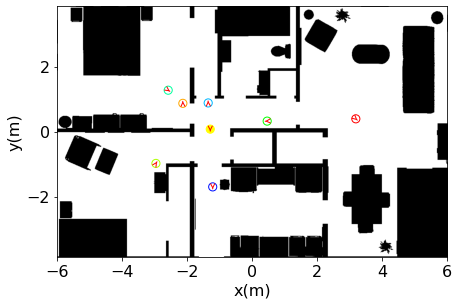

In [100]:
background = self.env.map.T
vis.add_map_background(background)
vis.render('video', 'indoorca.gif')
from IPython.display import Image
Image(filename='indoorca.gif')

In [ ]:
#TODO: Add code to run multiple simulations and save data